# Creation of an artificial neural network from scratch

This notebook currently contains a very basic implementation of an artificial neural network from scratch. 
The first cell contains

1. A definition of several activation functions and their derivatives.
2. A definition of a loss function and its derivative.
3. A definition of the forward propagation through a single layer
4. A definition of a backward propagation through a single layer


Your task is to do the following extentions to the code in this cell:

1. Add support for an additional activation function.
2. Add the use of a bias in the forward- and backward-propagation. 
As it is implemented now, all solutions have to pass the origin.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from itertools import permutations

np.random.seed(12345) # Set initial random seed (good to always do)

def tan_h(a):
    return (np.exp(a) - np.exp(-a)) / (np.exp(a) + np.exp(-a))


# Activation functions, the parameter f decides which activation function that is used.
# TODO: Add at least one new activation function and its derivative.
def activate(a, f="none"):
    if f=="none":
        a = np.clip(a, 1e-8, 1-1e-8)
        y = a
    elif f == "relu":
        y = np.maximum(a,0)
        if y.any() == np.nan:
            a = np.clip(a, 1e-8, 1-1e-8)
            y = np.maximum(a,0)
    elif f == "tanh":
        a = np.clip(a, 1e-8, 1-1e-8)
        y = tan_h(a)

    elif f == "sigmoid":
        a = np.clip(a, 1e-8, 1-1e-8)
        y = 1. / (1. + np.exp(-a))
    # elif f == "softmax":
    #     values = np.exp(a - np.max(a, axis=1, keepdims=True))
    #     y = values / np.sum(values, axis=1, keepdims=True)
    return y

    
# Derivatives of activation functions
def d_activate(a, f="none"):
    if f=="none":
        a = np.clip(a, 1e-8, 1-1e-8)
        dy = np.ones_like(a)

    elif f == "relu":
        dy = 1 * (a > 0)
        if dy.any() == np.nan:
            a = np.clip(a, 1e-8, 1-1e-8)
            dy = 1 * (a > 0)

    elif f == "tanh":
        a = np.clip(a, 1e-8, 1-1e-8)
        dy = 1 - tan_h(a) * tan_h(a)

    elif f == "sigmoid":
        a = np.clip(a, 1e-8, 1-1e-8)
        dy = a * (1 - a)

    return dy


def categorical_cross_entropy(y_hat, y):
    y_hat = np.array(y_hat)
    y_hat_clipped = np.clip(y_hat, 1e-7, 1-1e-7)
    if len(y.shape) == 1:
        conf = y_hat_clipped[range(y_hat), y]
    elif len(y_hat.shape) == 2:
        conf = np.sum(y_hat_clipped*y, axis=1)
    return -np.log(conf)

# This is the loss for a set of predictions y_hat compared to a set of real values y
def MSE_loss(y_hat, y):
    try:
        ans = 1/2 * np.mean((y_hat-y)**2)
    except OverflowError as e:
        y_hat = np.clip(y_hat, 1e-8, 1-1e-8)
        y = np.clip(y, 1e-8, 1-1e-8)
        ans = 1/2 * np.mean((y_hat-y)**2)

    return ans


# This is the derivative of the loss with respect to the predicted value y_hat
def d_MSE_loss(y_hat, y):
    m = y.shape[0]
    return 1./m * (y_hat-y)


# Propagate a signal through a layer in a neural network.
# TODO: Add support for the use of a bias as well
def propagate_forward(w, a, b, f="none"):
    # print("Weights Shape: ", w.shape)
    # print("Input shape: ", a.shape)
    # add the bias to the dot product of the x value inputs and the weights of the inputs in the batch
    z = activate(np.dot(a, w) + b, f)
    # print(z)
    return z
    

# Calculate the backward gradients that are passed throughout the layer in the backward pass.
# Returns both the derivative of the loss in respect to the weights w and the input signal a.
# TODO: Add support for a bias as well
def propagate_backward(w, b, a, dl_dz, f="none"):
    
    dl = d_activate(np.dot(a,w) + b, f) * dl_dz
    dw = np.dot(a.T, dl)
    # print(b.shape)
    # print(dl.shape)
    # print("weights shape: ", w.T.shape)
    da = np.dot(dl, w.T)
    # db = np.dot(dl[1], b.T)
    db = np.sum(dl, axis=0, keepdims=True)
    # print(db)
    
    return dw, da, db


def batch_split(number: int, size: int, x, y):
    batches_y = []
    batches_x = []
    start = 0
    end = size
    for i in range(number):
        batches_y.append(y[start:end])
        batches_x.append(x[start:end, :])
        start += size
        end += size
    return batches_x, batches_y



## An implementation of a neural network

Below is an implementation of a MLP neural network. This implementation is still lacking several details that are needed for the network to be robust and function well. Your task is to improve it with the following:

1. Add a bias to the activation functions that are fine tuned during training. 
2. Add a function that trains the network using minibatches (the network only trains on a few samples at a time) 
3. Optional: Make use of an validation set in the training function. The model should hence stop training when the loss starts to increase for the validation set.


In [2]:


# A class for a neural network
class NeuralNet(object):
    
    # Setup all parameters and activation functions.
    # TODO: Add support for a bias for each neuron
    def __init__ (self, input_dim, output_dim, neurons, activation='relu'):
        
        self.ws = [np.random.normal(0,2,(n,m)) for n,m in
                   zip([input_dim] + neurons, neurons + [output_dim])]

        # print(neurons)
        # print(len(neurons))
        # set biases in a random uniform distribution based on the number of neurons in each layer
        # self.bs = [np.zeros((len(neurons)-1, neurons[n])) for n in range(len(neurons))]
        self.bs = [np.random.uniform(0, 5, (1, n[0])) for n in zip(neurons)]
        self.activations = [activation] * len(neurons) + ["none"]
        # print(self.bs)
        # if output_dim == 1:
        #     self.activations = [activation] * len(neurons) + ["none"]
        #     self.type = "regression"
        # else:
        #     self.activations = [activation] * len(neurons) + ["softmax"]
        #     self.type = "classification"
        # print(self.activations)
    
    # Predict the input throught the network and calculate the output.
    # TODO: Add support for a bias for each neuron
    def forward(self, x):
        # print(x)
        for w,b,f in zip(self.ws, self.bs, self.activations):
            x = propagate_forward(w,x,b,f)
        return x
    
    
    # Adjust the weights in the network to better fit the desired output (y), given the input (x).
    # alpha is the learning learning.
    # TODO: Add support for a bias for each neuron and make sure these are learnt as well.
    def adjust_weights(self, x, y, alpha=1e-4):
        # print(x.shape)
        a = x
        al = []
        for w,b,f in zip(self.ws, self.bs, self.activations):
            al.append(a)
            # print("Bias Shape: ", b.shape, " Bias: ", b)
            # print("Weight Shape: ", w.shape, " Weight: ", w)
            # print("Activation: ", f)
            a = propagate_forward(w, a, b, f)
           
        loss = MSE_loss(a,y)
        da = d_MSE_loss(a,y)
        # if self.type == "regression":
        #     loss = MSE_loss(a,y)
        #     da = d_MSE_loss(a,y)
        # else:
        #     loss = categorical_cross_entropy(a, y)
        #     y_pred = np.argmax(a, axis=1)
        #     accuracy = np.mean(y_pred == y)
        #     # print("Accuracy: ", accuracy)
        #     da = 1
        for w,b,f,x in reversed(list(zip(self.ws, self.bs, self.activations, al))):
            dw, da, db = propagate_backward(w,b,x,da,f)
            w -= alpha * dw
            # print("Old Bias: ", b)
            b -= alpha * db
            # print("New Bias: ", b)
        return loss

    
    # A function for the training of the network.
    # TODO: Add a training loop where the weights and biases of the network is learnt over several epochs.
    # TODO: Add support for mini batches. That is, in each epoch the data should be split into several
    #       smaller subsets and the model should be trained on each of these subsets one at a time.
    # TODO: Optionally split the training data into training data and validation data.
    #       The validation data should be used to stop the training when the model stops to generalise and
    #       starts to overfit.
    def train_net(self, x, y, batch_size=64, epochs=100, alpha=None, plot=False):
        sc = MinMaxScaler()
        target_scaler = MinMaxScaler()
        validation_size = len(x) // 10
        reported_val_loss = 0
        # print("Validation Size: ", validation_size)
        remainder = (len(x) - validation_size) % batch_size
        # print("Remainder: ", remainder)
        validation_size = validation_size + remainder
        # print("Validation + Remainder: ", validation_size)
        val_x = x[-validation_size:, :]
        val_y = y[-validation_size:]
        val_y = np.array([val_y]).T
        x = x[:-validation_size, :]
        y = y[:-validation_size]
        # sc.fit(x, y)
        # x = sc.transform(x)
        number_of_batches = len(x) // batch_size
        # print("Number of Batches: ", number_of_batches)
        batches_x, batches_y = batch_split(number_of_batches, batch_size, x, y)
        best_val_loss = np.inf
        val_loss_list = []
        count = 0
        for e in range(epochs):
            if plot:
                print("Epoch: ", e + 1, "/", epochs)
            for batch in range(number_of_batches):
                # print(batch, "/", number_of_batches - 1)
                batch_x = batches_x[batch]
                # print("Batch X Shape: ", batch_x.shape)
                batch_y = batches_y[batch]
                batch_y = np.array([batch_y]).T
                # sc.fit(batch_x, batch_y)
                # target_scaler.fit(batch_y)
                # batch_x = sc.transform(batch_x)
                # batch_y = target_scaler.transform(batch_y)
                batch_loss = 0
                if alpha is None:
                    batch_loss = self.adjust_weights(batch_x, batch_y)
                else:
                    batch_loss = self.adjust_weights(batch_x, batch_y, alpha)
                if plot:
                    print("Loss: ", np.mean(batch_loss))
            # print("Validation X Shape: ", val_x.shape)
            # val_x = sc.transform(val_x)
            # val_y = target_scaler.transform(val_y)
            val_y_hat = self.forward(val_x)
            val_loss = MSE_loss(val_y_hat, val_y)
            val_loss_list.append(val_loss)
            reported_val_loss = val_loss
            print("Validation Loss: ", val_loss)
            if np.mean(val_loss) > best_val_loss:
                count = count + 1
                if count > 9:
                    print("Early stop triggered")
                    break
            else:
                best_val_loss = np.mean(val_loss)
        if plot:
            plt.plot([val_loss_list[i] for i in range(len(val_loss_list))])
            plt.title("Validation Loss")
            plt.show()
        return reported_val_loss


In [27]:
def grid_search(X, y, features):
    layers_grid = [2, 3, 4]
    neurons_array = [8, 16, 32, 64, 128]
    lr_array = [0.00000001, 0.0000001, 0.000001, 0.00001, 0.0001, 0.001, 0.01, 0.1]
    activation_array = ['none', 'relu', 'sigmoid', 'tanh']
    best_loss = np.inf
    best_hidden_layers = [8, 16]
    best_batch_size = 16
    best_lr = 0.1
    best_activation = 'none'
    for layers in layers_grid:
        for i in permutations(neurons_array, layers):
            # print(i)
            if len(i) == layers:
                hidden_layers = list(i)
                for batch in range(16,144,16):
                    for lr in lr_array:
                        for activation in activation_array:
                            print("Current params: ", lr, batch, hidden_layers, activation)
                            nn = NeuralNet(features, 1, hidden_layers, activation=activation)
                            loss = nn.train_net(X, y, batch_size=batch, epochs=1, alpha=lr)
                            if loss < best_loss:
                                best_hidden_layers = hidden_layers
                                best_batch_size = batch
                                best_lr = lr
                                best_loss = loss
                                best_activation = activation
    return best_batch_size, best_hidden_layers, best_lr, best_activation

## Main programs

This cell should contain your different programs. In this cell you should present:

1. At least 3 programs where the neural network is applied to 3 different datasets.
2. You should also have at least 2 programs where you fine tune 2 hyper-parameters.

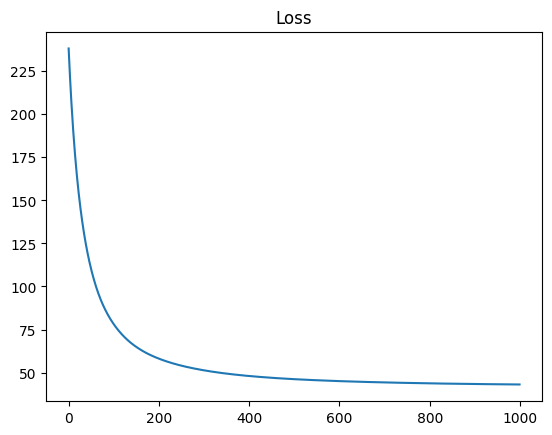

In [28]:
# A simple example program

def main1():
    np.random.seed(1234) # Set initial random seed (good to always do)
    n = 1000
    d = 4

    k = np.random.randint(0,10,(d,1))
    x = np.random.normal(0,1,(n,d))
    y = np.dot(x,k) + 0.1 + np.random.normal(0,0.01,(n,1))


    nn = NeuralNet(d, 1, [18, 12])

    plt.plot([nn.adjust_weights(x, y) for _ in range(1000)])
    plt.title("Loss")
    plt.show()
main1()

Epoch:  1 / 100
Loss:  5849518143360.883
Loss:  2.5547498426344047e+31
Loss:  22.50892778535507
Loss:  61.53104213771248
Loss:  33.17180318094329
Loss:  59.820439106618714
Loss:  36.2559425030337
Loss:  44.603922145652945
Loss:  39.022314634559585
Loss:  50.76107082231184
Loss:  34.96023032002319
Loss:  47.37753572594107
Loss:  22.794214771019984
Loss:  44.28329861212694
Loss:  45.537333031628386
Loss:  38.050716125156306
Loss:  41.850093619991476
Loss:  27.429703684965677
Loss:  40.770784120865414
Loss:  33.91348027912438
Loss:  46.43145609181602
Loss:  49.56642608172091
Loss:  57.145472104851684
Loss:  45.80610998281656
Loss:  50.646646111152954
Loss:  51.00802472751661
Loss:  32.25449371986891
Loss:  37.22163458970944
Loss:  34.60573680439796
Loss:  55.39486720583951
Loss:  34.763630831209944
Loss:  49.255275427509126
Loss:  55.78647998620158
Loss:  39.64198653264464
Loss:  51.79718000092874
Loss:  64.54935739432152
Loss:  55.06875854103385
Loss:  35.275832619743845
Loss:  29.898248

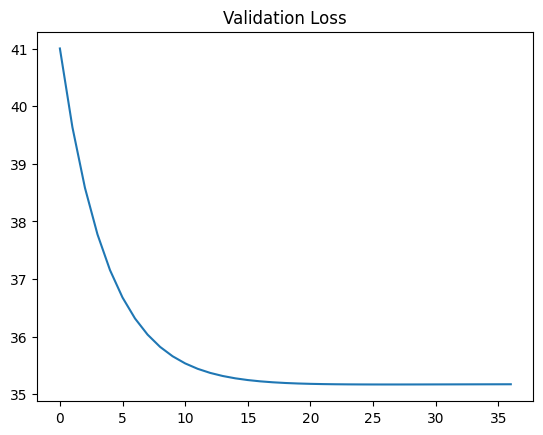

In [3]:
def main2():
    np.random.seed(1234) # Set initial random seed (good to always do)
    casp_dataset = pd.read_csv("CASP.tmls")
    casp_dataset = casp_dataset.iloc[1:,:]
    casp_dataset = casp_dataset.sample(frac=1)
    casp_dataset = np.array(casp_dataset, float)

    # print(concrete_dataset)
    casp_X = casp_dataset[:,1:]
    casp_y = casp_dataset[:,0]
    samples, features = casp_X.shape
    # batch_size, hidden_layers, lr, activation = grid_search(casp_X, casp_y, features)
    # print("Number of Samples: ", samples)
    # print("Number of Features: ", features)
    casp_nn = NeuralNet(features, 1, [18,12])
    casp_nn.train_net(casp_X, casp_y, batch_size=32, epochs=100, plot=True)
    # print("Best params: Layers are ", hidden_layers, ". batch size is ", batch_size, ". Activation function is ", activation, ". Learning rate is ", lr)
main2()

Current params:  1e-08 16 [8, 16] none
Validation Loss:  340.8070756389851
Current params:  1e-08 16 [8, 16] relu
Validation Loss:  41171.57441728381
Current params:  1e-08 16 [8, 16] sigmoid
Validation Loss:  339.59063430984594
Current params:  1e-08 16 [8, 16] tanh
Validation Loss:  342.67600010841676
Current params:  1e-07 16 [8, 16] none
Validation Loss:  337.0980564702621
Current params:  1e-07 16 [8, 16] relu
Validation Loss:  1165.0505524848202
Current params:  1e-07 16 [8, 16] sigmoid
Validation Loss:  339.26226763033793
Current params:  1e-07 16 [8, 16] tanh
Validation Loss:  340.77578223983676
Current params:  1e-06 16 [8, 16] none
Validation Loss:  335.1276157368862
Current params:  1e-06 16 [8, 16] relu
Validation Loss:  355.6184482758621
Current params:  1e-06 16 [8, 16] sigmoid
Validation Loss:  339.81065728924096
Current params:  1e-06 16 [8, 16] tanh
Validation Loss:  344.6726655645578
Current params:  1e-05 16 [8, 16] none
Validation Loss:  334.99108963577373
Current p

C:\Users\SamuelMcmurray\AppData\Local\Temp\ipykernel_6620\4084819139.py:110: RuntimeWarning: invalid value encountered in multiply
  dl = d_activate(np.dot(a,w) + b, f) * dl_dz


Validation Loss:  343.40513312499206
Current params:  1e-05 64 [16, 32, 128] none
Validation Loss:  340.6033320609773
Current params:  1e-05 64 [16, 32, 128] relu
Validation Loss:  355.6184482758621
Current params:  1e-05 64 [16, 32, 128] sigmoid
Validation Loss:  340.2675307137562
Current params:  1e-05 64 [16, 32, 128] tanh
Validation Loss:  343.1312249225368
Current params:  0.0001 64 [16, 32, 128] none
Validation Loss:  339.63220830968805
Current params:  0.0001 64 [16, 32, 128] relu
Validation Loss:  355.6184482758621
Current params:  0.0001 64 [16, 32, 128] sigmoid
Validation Loss:  339.82667728062546
Current params:  0.0001 64 [16, 32, 128] tanh
Validation Loss:  344.39062311245164
Current params:  0.001 64 [16, 32, 128] none
Validation Loss:  336.7147010368539
Current params:  0.001 64 [16, 32, 128] relu
Validation Loss:  355.6184482758621
Current params:  0.001 64 [16, 32, 128] sigmoid
Validation Loss:  340.4270203974616
Current params:  0.001 64 [16, 32, 128] tanh
Validation 

C:\Users\SamuelMcmurray\AppData\Local\Temp\ipykernel_6620\4084819139.py:79: RuntimeWarning: overflow encountered in square
  ans = 1/2 * np.mean((y_hat-y)**2)
C:\Users\SamuelMcmurray\.conda\envs\tf\lib\site-packages\numpy\core\_methods.py:180: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Validation Loss:  339.3653662720531
Current params:  0.0001 32 [64, 32, 128] relu
Validation Loss:  355.6184482758621
Current params:  0.0001 32 [64, 32, 128] sigmoid
Validation Loss:  340.2516385532765
Current params:  0.0001 32 [64, 32, 128] tanh
Validation Loss:  341.3401469288242
Current params:  0.001 32 [64, 32, 128] none
Validation Loss:  334.97721738480465
Current params:  0.001 32 [64, 32, 128] relu
Validation Loss:  355.6184482758621
Current params:  0.001 32 [64, 32, 128] sigmoid
Validation Loss:  340.1961387799482
Current params:  0.001 32 [64, 32, 128] tanh
Validation Loss:  339.6206369273752
Current params:  0.01 32 [64, 32, 128] none
Validation Loss:  331.7874140264138
Current params:  0.01 32 [64, 32, 128] relu
Validation Loss:  355.6184482758621
Current params:  0.01 32 [64, 32, 128] sigmoid
Validation Loss:  340.1105791243564
Current params:  0.01 32 [64, 32, 128] tanh
Validation Loss:  337.3780875336135
Current params:  0.1 32 [64, 32, 128] none
Validation Loss:  331

C:\Users\SamuelMcmurray\.conda\envs\tf\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Validation Loss:  287.66199354080385
Current params:  0.01 80 [8, 128, 16, 64] none
Validation Loss:  280.53474849196994
Current params:  0.01 80 [8, 128, 16, 64] relu
Validation Loss:  301.5281132075471
Current params:  0.01 80 [8, 128, 16, 64] sigmoid
Validation Loss:  286.58520142721477
Current params:  0.01 80 [8, 128, 16, 64] tanh
Validation Loss:  285.27194371891534
Current params:  0.1 80 [8, 128, 16, 64] none
Validation Loss:  279.2526417271887
Current params:  0.1 80 [8, 128, 16, 64] relu
Validation Loss:  295.37198870416006
Current params:  0.1 80 [8, 128, 16, 64] sigmoid
Validation Loss:  287.1452281908911
Current params:  0.1 80 [8, 128, 16, 64] tanh
Validation Loss:  284.4724599847738
Current params:  1e-08 96 [8, 128, 16, 64] none
Validation Loss:  293.92345530561903
Current params:  1e-08 96 [8, 128, 16, 64] relu
Validation Loss:  5.737693157087372e+39
Current params:  1e-08 96 [8, 128, 16, 64] sigmoid
Validation Loss:  293.605056275776
Current params:  1e-08 96 [8, 128,

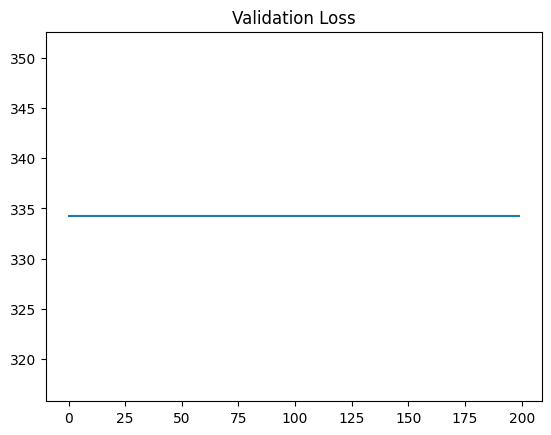

Best params: Layers are  [128, 8, 16] . batch size is  48 . Activation function is  relu . Learning rate is  0.1


In [16]:
def main3():
    np.random.seed(1234) # Set initial random seed (good to always do)
    boston_dataset = pd.read_csv("boston.tmls")
    boston_dataset = boston_dataset.iloc[1:,:]
    boston_dataset = boston_dataset.sample(frac=1)
    boston_dataset = np.array(boston_dataset, float)
    # print(concrete_dataset)
    boston_X = boston_dataset[:,:-1]
    boston_y = boston_dataset[:,-1]
    samples, features = boston_X.shape
    batch_size, hidden_layers, lr, activation = grid_search(boston_X, boston_y, features)
    # print("Number of Samples: ", samples)
    # print("Number of Features: ", features)
    concrete_nn = NeuralNet(features, 1, hidden_layers, activation=activation)
    concrete_nn.train_net(boston_X, boston_y, batch_size=batch_size, alpha=lr, epochs=200, plot=True)
    print("Best params: Layers are ", hidden_layers, ". batch size is ", batch_size, ". Activation function is ", activation, ". Learning rate is ", lr)
main3()

Current params:  1e-08 16 [8, 16] none
Validation Loss:  6.6911502552550415
Current params:  1e-08 16 [8, 16] relu
Validation Loss:  454.00135865944384
Current params:  1e-08 16 [8, 16] sigmoid
Validation Loss:  6.237277287704664
Current params:  1e-08 16 [8, 16] tanh
Validation Loss:  6.697596553960447
Current params:  1e-07 16 [8, 16] none
Validation Loss:  6.696092066872966
Current params:  1e-07 16 [8, 16] relu
Validation Loss:  724.3491953273583
Current params:  1e-07 16 [8, 16] sigmoid
Validation Loss:  6.165343430398131
Current params:  1e-07 16 [8, 16] tanh
Validation Loss:  6.1695273413437794
Current params:  1e-06 16 [8, 16] none
Validation Loss:  6.038898759827094
Current params:  1e-06 16 [8, 16] relu
Validation Loss:  95.69453550807438
Current params:  1e-06 16 [8, 16] sigmoid
Validation Loss:  6.285383706536117
Current params:  1e-06 16 [8, 16] tanh
Validation Loss:  6.6879108342344145
Current params:  1e-05 16 [8, 16] none
Validation Loss:  5.956993136452527
Current para

C:\Users\SamuelMcmurray\AppData\Local\Temp\ipykernel_6620\4084819139.py:79: RuntimeWarning: overflow encountered in square
  ans = 1/2 * np.mean((y_hat-y)**2)


Validation Loss:  6.357000177619312
Current params:  1e-08 16 [8, 16, 128] relu
Validation Loss:  32010.549143373268
Current params:  1e-08 16 [8, 16, 128] sigmoid
Validation Loss:  6.220995881590299
Current params:  1e-08 16 [8, 16, 128] tanh
Validation Loss:  6.66053805288076
Current params:  1e-07 16 [8, 16, 128] none
Validation Loss:  6.503838697837355
Current params:  1e-07 16 [8, 16, 128] relu
Validation Loss:  2646.430412715733
Current params:  1e-07 16 [8, 16, 128] sigmoid
Validation Loss:  6.238353557074111
Current params:  1e-07 16 [8, 16, 128] tanh
Validation Loss:  6.858088551712666
Current params:  1e-06 16 [8, 16, 128] none
Validation Loss:  6.4984153845937
Current params:  1e-06 16 [8, 16, 128] relu
Validation Loss:  48.43337977068048
Current params:  1e-06 16 [8, 16, 128] sigmoid
Validation Loss:  6.17064851160631
Current params:  1e-06 16 [8, 16, 128] tanh
Validation Loss:  6.65324965746739
Current params:  1e-05 16 [8, 16, 128] none
Validation Loss:  6.369942893170077

C:\Users\SamuelMcmurray\AppData\Local\Temp\ipykernel_6620\4084819139.py:110: RuntimeWarning: invalid value encountered in multiply
  dl = d_activate(np.dot(a,w) + b, f) * dl_dz


Validation Loss:  6.270563726813601
Current params:  1e-07 128 [32, 128, 64] tanh
Validation Loss:  7.028809940519195
Current params:  1e-06 128 [32, 128, 64] none
Validation Loss:  6.422978081450126
Current params:  1e-06 128 [32, 128, 64] relu
Validation Loss:  11147.302459804812
Current params:  1e-06 128 [32, 128, 64] sigmoid
Validation Loss:  6.256436106868335
Current params:  1e-06 128 [32, 128, 64] tanh
Validation Loss:  7.160477373035739
Current params:  1e-05 128 [32, 128, 64] none
Validation Loss:  6.726317033687597
Current params:  1e-05 128 [32, 128, 64] relu
Validation Loss:  173.307253400856
Current params:  1e-05 128 [32, 128, 64] sigmoid
Validation Loss:  6.293573613868846
Current params:  1e-05 128 [32, 128, 64] tanh
Validation Loss:  7.11723012799329
Current params:  0.0001 128 [32, 128, 64] none
Validation Loss:  6.3730894712650885
Current params:  0.0001 128 [32, 128, 64] relu
Validation Loss:  8.480235189285713
Current params:  0.0001 128 [32, 128, 64] sigmoid
Vali

C:\Users\SamuelMcmurray\.conda\envs\tf\lib\site-packages\numpy\core\_methods.py:180: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Validation Loss:  6.6370315299563964
Current params:  0.0001 112 [8, 16, 64, 32] none
Validation Loss:  6.060583677039336
Current params:  0.0001 112 [8, 16, 64, 32] relu
Validation Loss:  8.386074596774195
Current params:  0.0001 112 [8, 16, 64, 32] sigmoid
Validation Loss:  6.027246331260743
Current params:  0.0001 112 [8, 16, 64, 32] tanh
Validation Loss:  6.6003909783061765
Current params:  0.001 112 [8, 16, 64, 32] none
Validation Loss:  5.932259945450466
Current params:  0.001 112 [8, 16, 64, 32] relu
Validation Loss:  8.386074596774195
Current params:  0.001 112 [8, 16, 64, 32] sigmoid
Validation Loss:  6.20164363308366
Current params:  0.001 112 [8, 16, 64, 32] tanh
Validation Loss:  6.885942747177869
Current params:  0.01 112 [8, 16, 64, 32] none
Validation Loss:  5.058606540985586
Current params:  0.01 112 [8, 16, 64, 32] relu
Validation Loss:  8.386074596774195
Current params:  0.01 112 [8, 16, 64, 32] sigmoid
Validation Loss:  6.074664472050189
Current params:  0.01 112 [8,

C:\Users\SamuelMcmurray\.conda\envs\tf\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Validation Loss:  nan
Current params:  0.01 16 [16, 32, 64, 8] sigmoid
Validation Loss:  6.312378659072712
Current params:  0.01 16 [16, 32, 64, 8] tanh
Validation Loss:  5.831714148285625
Current params:  0.1 16 [16, 32, 64, 8] none
Validation Loss:  5.104385436924673
Current params:  0.1 16 [16, 32, 64, 8] relu
Validation Loss:  8.535983233695651
Current params:  0.1 16 [16, 32, 64, 8] sigmoid
Validation Loss:  6.1205297611672504
Current params:  0.1 16 [16, 32, 64, 8] tanh
Validation Loss:  5.831714148285625
Current params:  1e-08 32 [16, 32, 64, 8] none
Validation Loss:  6.827340879796918
Current params:  1e-08 32 [16, 32, 64, 8] relu
Validation Loss:  97771.64169013852
Current params:  1e-08 32 [16, 32, 64, 8] sigmoid
Validation Loss:  6.289086020959443
Current params:  1e-08 32 [16, 32, 64, 8] tanh
Validation Loss:  7.515598784546373
Current params:  1e-07 32 [16, 32, 64, 8] none
Validation Loss:  6.199363290329253
Current params:  1e-07 32 [16, 32, 64, 8] relu
Validation Loss:  

C:\Users\SamuelMcmurray\.conda\envs\tf\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Validation Loss:  6.87049158273053
Current params:  1e-08 32 [16, 128, 64, 32] relu
Validation Loss:  21057.93195808068
Current params:  1e-08 32 [16, 128, 64, 32] sigmoid
Validation Loss:  6.477546260391359
Current params:  1e-08 32 [16, 128, 64, 32] tanh
Validation Loss:  7.279299674047508
Current params:  1e-07 32 [16, 128, 64, 32] none
Validation Loss:  7.186450691675738
Current params:  1e-07 32 [16, 128, 64, 32] relu
Validation Loss:  919.1942144121217
Current params:  1e-07 32 [16, 128, 64, 32] sigmoid
Validation Loss:  6.411136764712917
Current params:  1e-07 32 [16, 128, 64, 32] tanh
Validation Loss:  7.674941545771002
Current params:  1e-06 32 [16, 128, 64, 32] none
Validation Loss:  6.075314159599522
Current params:  1e-06 32 [16, 128, 64, 32] relu
Validation Loss:  8.728527393518519
Current params:  1e-06 32 [16, 128, 64, 32] sigmoid
Validation Loss:  6.4825444474208025
Current params:  1e-06 32 [16, 128, 64, 32] tanh
Validation Loss:  6.946752096833342
Current params:  1e-

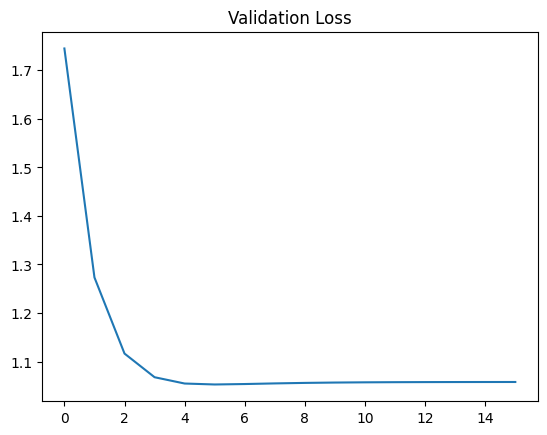

Best params: Layers are  [8, 128] . batch size is  16 . Activation function is  relu . Learning rate is  0.01


In [17]:
def main4():
    np.random.seed(1234) # Set initial random seed (good to always do)
    fish_toxicity_dataset = pd.read_csv("qsar_fish_toxicity.tmls", sep=';')
    fish_toxicity_dataset = fish_toxicity_dataset.iloc[1:,:]
    fish_toxicity_dataset = fish_toxicity_dataset.sample(frac=1)
    fish_toxicity_dataset = np.array(fish_toxicity_dataset, float)
    # print(concrete_dataset)
    fish_toxicity_X = fish_toxicity_dataset[:,:-1]
    fish_toxicity_y = fish_toxicity_dataset[:,-1]
    samples, features = fish_toxicity_X.shape
    batch_size, hidden_layers, lr, activation = grid_search(fish_toxicity_X, fish_toxicity_y, features)
    # print("Number of Samples: ", samples)
    # print("Number of Features: ", features)
    fish_toxicity_nn = NeuralNet(features, 1, hidden_layers, activation=activation)
    fish_toxicity_nn.train_net(fish_toxicity_X, fish_toxicity_y, batch_size=batch_size, alpha=lr, epochs= 200, plot=True)
    print("Best params: Layers are ", hidden_layers, ". batch size is ", batch_size, ". Activation function is ", activation, ". Learning rate is ", lr)
main4()